Indian Housing Markets Analysis and Visualization

Team Members:
    M. Sri Manish Reddy (21911A05G7)
    B. Nilesh (21911A05D7)
    B. Rakesh Kumar (21911A05D9)
    B. Srikanth (21911A05E2)
   
Project Guide:
    Ms. A. Lalitha
Project Coordinators:
    Ms. G. Surekha
    Ms. K. Spandana Kumari



This project deals with Exploratory Data Analysis and Visualization of housing markets in major Indian Cities of Bengaluru, Chennai, Delhi, Hyderabad and Mumbai using regression models:

### Getting started

In [4]:
# Data manipulation and analysis
import numpy as np
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Machine learning models
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

# Preprocessing and model evaluation
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn import metrics

Loading all the datasets into respective dataframes

In [5]:
ban_df = pd.read_csv('C:/Users/prave/Documents/MiniProject/Data/Bangalore.csv')
chn_df = pd.read_csv('C:/Users/prave/Documents/MiniProject/Data/Chennai.csv')
del_df = pd.read_csv('C:/Users/prave/Documents/MiniProject/Data/Delhi.csv')
hyd_df = pd.read_csv('C:/Users/prave/Documents/MiniProject/Data/Hyderabad.csv')
mum_df = pd.read_csv('C:/Users/prave/Documents/MiniProject/Data/Mumbai.csv')

Exploration of the dataframes.

In [6]:
hyd_df

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
0,6968000,1340,Nizampet,2,0,0,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
1,29000000,3498,Hitech City,4,0,0,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
2,6590000,1318,Manikonda,2,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,5739000,1295,Alwal,3,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,5679000,1145,Kukatpally,2,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2513,11000000,1460,Nacharam,2,1,9,9,9,9,9,...,9,9,9,9,9,9,9,9,9,9
2514,26000000,1314,Manikonda,2,1,9,9,9,9,9,...,9,9,9,9,9,9,9,9,9,9
2515,13300000,2625,Madhapur,3,1,9,9,9,9,9,...,9,9,9,9,9,9,9,9,9,9
2516,10800000,2050,Hitech City,3,0,9,9,9,9,9,...,9,9,9,9,9,9,9,9,9,9


Dataset Overview

The dataset in question is a collection of scraped data that encompasses a wide range of information related to the real estate market in India. Specifically, it includes a total of 40 explanatory variables that describe different aspects of houses in Indian metropolitan areas such as:

In [7]:
def print_column_table(df, columns_per_row=3):
    max_length = max(len(col) for col in df.columns)
    
    for i in range(0, len(df.columns), columns_per_row):
        row_columns = df.columns[i:i+columns_per_row]
        row = " ".join(f"{col:<{max_length}}" for col in row_columns)
        row = row.ljust(max_length * columns_per_row - 1) + " "
        print(row)

print_column_table(hyd_df, columns_per_row=6)

Price               Area                Location            No. of Bedrooms     Resale              MaintenanceStaff    
Gymnasium           SwimmingPool        LandscapedGardens   JoggingTrack        RainWaterHarvesting IndoorGames         
ShoppingMall        Intercom            SportsFacility      ATM                 ClubHouse           School              
24X7Security        PowerBackup         CarParking          StaffQuarter        Cafeteria           MultipurposeRoom    
Hospital            WashingMachine      Gasconnection       AC                  Wifi                Children'splayarea  
LiftAvailable       BED                 VaastuCompliant     Microwave           GolfCourse          TV                  
DiningTable         Sofa                Wardrobe            Refrigerator                                          


Important Note

It's essential to understand that for some houses, information about certain amenities was not provided. In such cases, the value '9' was used to indicate the absence of information about the apartment. However, it's crucial to recognize that these '9' values do not necessarily mean the absence of such a feature in real life.

'9' values do not represent actual data and could skew statistical analyses if treated as real values, leading to inaccurate conclusions.

To address the issue of missing data, all instances of '9' were replaced with NaN (Not a Number). This is a standard approach to represent missing data in pandas DataFrames, ensuring that missing data is properly handled and distinguished from actual data.

By replacing '9' with NaN, the analysis ensures that missing data is properly represented and can be handled appropriately in subsequent data cleaning, exploration, and modeling steps, ultimately leading to more accurate and reliable results.

In [82]:
#Replacing the 9 values with NaN
ban_df.replace(9, np.nan, inplace=True)
chn_df.replace(9, np.nan, inplace=True)
del_df.replace(9, np.nan, inplace=True)
hyd_df.replace(9, np.nan, inplace=True)
mum_df.replace(9, np.nan, inplace=True)

#Displaying the shape of the dataframes
print("Bengaluru: ", ban_df.shape)
print("Chennai: ", chn_df.shape)
print("Delhi: ", del_df.shape)
print("Hyderabad: ", hyd_df.shape)
print("Mumbai: ", mum_df.shape)

Bengaluru:  (1951, 40)
Chennai:  (2233, 40)
Delhi:  (2002, 40)
Hyderabad:  (2434, 40)
Mumbai:  (1398, 40)


Lets Visualize these missing values

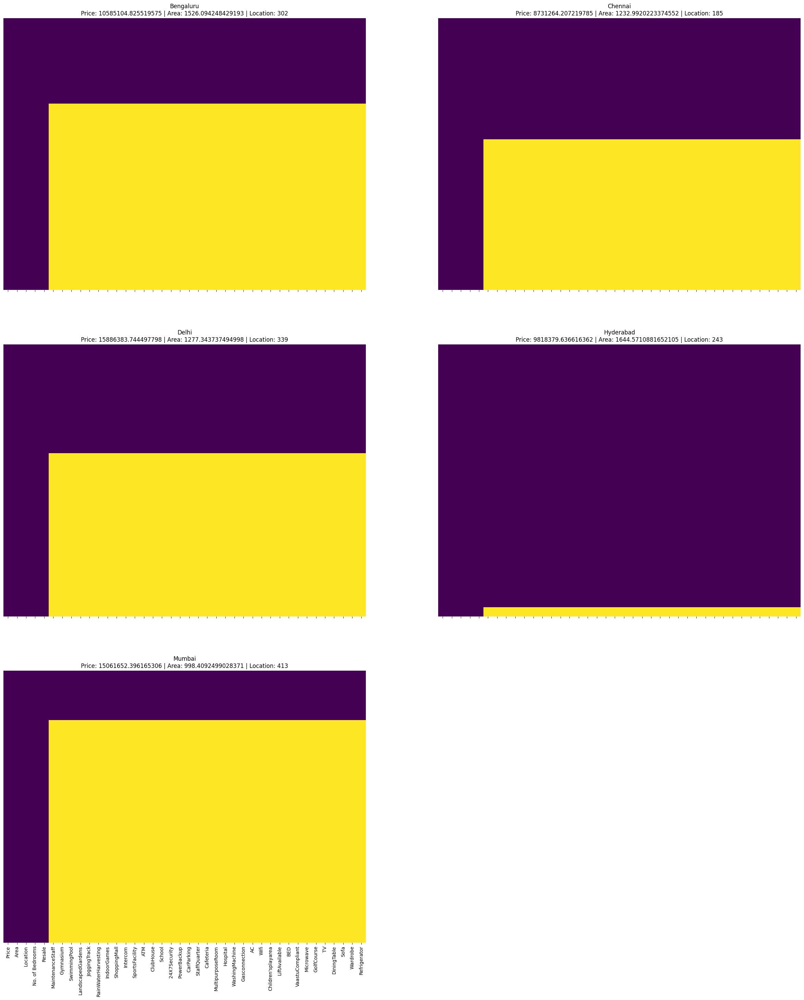

In [9]:
# Visualization using Matplotlib and Seaborn Libraries
fig, ax = plt.subplots(3, 2, figsize=(30,35), sharex=True)

# Bengaluru
sns.heatmap(ban_df.isnull(), yticklabels=False, cbar=False, cmap='viridis', ax=ax[0][0])
ax[0][0].set_title('Bengaluru\nPrice: {} | Area: {} | Location: {}'.format(ban_df['Price'].mean(), ban_df['Area'].mean(), ban_df['Location'].nunique()))

# Chennai
sns.heatmap(chn_df.isnull(), yticklabels=False, cbar=False, cmap='viridis', ax=ax[0][1])
ax[0][1].set_title('Chennai\nPrice: {} | Area: {} | Location: {}'.format(chn_df['Price'].mean(), chn_df['Area'].mean(), chn_df['Location'].nunique()))

# Delhi
sns.heatmap(del_df.isnull(), yticklabels=False, cbar=False, cmap='viridis', ax=ax[1][0])
ax[1][0].set_title('Delhi\nPrice: {} | Area: {} | Location: {}'.format(del_df['Price'].mean(), del_df['Area'].mean(), del_df['Location'].nunique()))

# Hyderabad
sns.heatmap(hyd_df.isnull(), yticklabels=False, cbar=False, cmap='viridis', ax=ax[1][1])
ax[1][1].set_title('Hyderabad\nPrice: {} | Area: {} | Location: {}'.format(hyd_df['Price'].mean(), hyd_df['Area'].mean(), hyd_df['Location'].nunique()))

# Mumbai
sns.heatmap(mum_df.isnull(), yticklabels=False, cbar=False, cmap='viridis', ax=ax[2][0])
ax[2][0].set_title('Mumbai\nPrice: {} | Area: {} | Location: {}'.format(mum_df['Price'].mean(), mum_df['Area'].mean(), mum_df['Location'].nunique()))

fig.delaxes(ax[2][1])

plt.show()

In [10]:
#Converting the price from Rupees to Lakhs

ban_df['Price'] = ban_df['Price']/10**5
chn_df['Price'] = chn_df['Price']/10**5
del_df['Price'] = del_df['Price']/10**5
hyd_df['Price'] = hyd_df['Price']/10**5
mum_df['Price'] = mum_df['Price']/10**5

Combining all cities datasets

In [11]:
def merge_all(df1, df2, df3, df4, df5):
    df1['City'] = 'Bengaluru'
    df2['City'] = 'Chennai'
    df3['City'] = 'Delhi'
    df4['City'] = 'Hyderabad'
    df5['City'] = 'Mumbai'
    merged_df = pd.concat([ban_df, chn_df, del_df, hyd_df, mum_df]).reset_index(drop=True)
    return merged_df

#### EDA Functions

First the different functions for Exploratory Data Analysis are created

In [106]:
#Function to visualize the necessary data of each city.
def data_plots(df, city):
    #Scatterplot of the Area and price against no of bedrooms in each city
    plt.figure(figsize=(15, 8))
    sns.scatterplot(x=df['Price'], y=df['Area'], hue=df['No. of Bedrooms'])
    plt.title('Area(sq. ft) vs Price(lakhs) in '+city)
    plt.show()

    #Countplot of the Properties at every location in each city
    plt.figure(figsize=(20, 8))
    sns.countplot(y='Location', data=df, order=df.Location.value_counts().index[:25])
    plt.title('Number of units at each location in '+city)
    plt.show()
    
    # Bar plot of Affordable locations by location
    plt.figure(figsize=(10, 10))
    most_price_by_location = df.groupby('Location')['Price'].mean().sort_values().head(40)
    sns.barplot(x=most_price_by_location.values, y=most_price_by_location.index)
    plt.title('Most Affordable Areas in ' + city)
    plt.show()
    
    # Bar plot for Most Demanded Locations sorted by average area
    plt.figure(figsize=(10, 10))
    most_demanded_locations = df.groupby('Location').agg({'Area': 'mean', 'Location': 'count'}).rename(columns={'Location': 'Count'})
    most_demanded_locations = most_demanded_locations.sort_values(by='Area', ascending=False).head(40)
    sns.barplot(x=most_demanded_locations['Count'], y=most_demanded_locations.index, palette='viridis')
    plt.title('Most Demanded Areas in ' + city)
    plt.show()
    
    #Distribution plot of Sale Price across each city
    fig, ax = plt.subplots(1, 2, figsize=(20,5))
    fig.suptitle('Distribution of Sales across '+city)
    sns.histplot(df['Price'], kde=True, ax=ax[0])
    sns.histplot(np.log(df['Price']), kde=True, ax=ax[1])
    plt.show()
    
    #Catplots of Price and Area against each City in the Merged data
    sns.catplot(y='Location', x='Price', data=df, jitter=0.15, height=10, aspect=2)
    plt.title('House Price(in lakhs) variation in these cities')
    plt.show()
    sns.catplot(y='Location', x='Area', data=df, jitter=0.15, height=10, aspect=2)
    plt.title('House Area(in sq. ft) variation in these cities')
    plt.show()

    #Correlation heatmap of the attributes in each city
    numeric_correlation = df.select_dtypes(exclude=object).corr()
    plt.figure(figsize=(20,20))
    sns.heatmap(numeric_correlation, annot = True, square=True, fmt='.1f')
    plt.title('Correlation', fontsize=50)
    plt.show()

In [135]:
#Function to visualize the necessary data of all the cities merged.
def merged_plots(merged_df):
    #Catplots of Price and Area against each City in the Merged data
    sns.catplot(x='City', y='Price', data=merged_df, jitter=0.15, height=10, aspect=2)
    plt.title('House Price(in lakhs) variation in these cities')
    plt.show()
    sns.catplot(x='City', y='Area', data=merged_df, jitter=0.15, height=10, aspect=2)
    plt.title('House Area(in sq. ft) variation in these cities')
    plt.show()

    # Smooth line graph of the House price vs Area with respect to each city in the merged data
    #filtered_df = merged_df[merged_df['Price'] <= 600]
    window_size = 15
    smoothed_df = (
        merged_df.groupby('City')
        .apply(lambda x: x[['Price', 'Area']].rolling(window=window_size).mean())
        .reset_index()
    )
    smoothed_df['City'] = merged_df['City']
    plt.figure(figsize=(20,10))
    sns.lineplot(x=smoothed_df['Price'], y=smoothed_df['Area'], hue=smoothed_df['City'], linewidth=1)
    plt.title('House Price(lakhs) vs Area(sq. ft) across cities')
    #plt.gca().set_xticks(range(0, 1500, 100))
    plt.show()
    
    #Correlation heatmap of the Merged Data
    numeric_correlation = merged_df.select_dtypes(exclude=object).corr()
    plt.figure(figsize=(20,20))
    sns.heatmap(numeric_correlation, annot = True, square=True, fmt='.1f')
    plt.title('Correlation', fontsize=50)
    plt.show()

#### machine learning models

The following functions are defined for analyzing and visualizing the performance of different machine learning models, including their scoring plots.


In [14]:
#Function to implement these 6 regression models and evaluate their performance
def models_evaluation(df):
        #Encoding the Categorical Values
        label_encoder = LabelEncoder()
        df['Location'] = label_encoder.fit_transform(df.Location)

        #Creating the training data and test data
        X = df.drop(['Price'], axis=1)
        #To create higher efficiency we take the log value
        y = np.log(df['Price'])
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


        #Linear Regression
        lr_model = LinearRegression()
        lr_model.fit(X_train, y_train)
        lr_y_pred = lr_model.predict(X_test)
        lr_score = lr_model.score(X_test, y_test)
        lr_cv = cross_val_score(estimator = lr_model, X = X_train, y = y_train, cv = 10)
        lr_mae = metrics.mean_absolute_error(y_test, lr_y_pred)
        lr_mse = metrics.mean_squared_error(y_test, lr_y_pred)
        lr_rmse = np.sqrt(lr_mse)
        lr_r2 = metrics.r2_score(y_test, lr_y_pred)


        # Polynomial Regression
        poly = PolynomialFeatures(degree=2, include_bias=False)
        scaler = StandardScaler()
        ridge = Ridge(alpha=1.0)  # You can adjust the alpha value
        pr_model = make_pipeline(poly, scaler, ridge)
        pr_model.fit(X_train, y_train)
        pr_y_pred = pr_model.predict(X_test)
        pr_score = pr_model.score(X_test, y_test)
        pr_cv = cross_val_score(estimator=pr_model, X=X_train, y=y_train, cv=10)
        pr_mae = metrics.mean_absolute_error(y_test, pr_y_pred)
        pr_mse = metrics.mean_squared_error(y_test, pr_y_pred)
        pr_rmse = np.sqrt(pr_mse)
        pr_r2 = metrics.r2_score(y_test, pr_y_pred)


        #Decision Tree
        dt_model = DecisionTreeRegressor(random_state=0)
        dt_model.fit(X_train, y_train)
        dt_y_pred = dt_model.predict(X_test)
        dt_score = dt_model.score(X_test, y_test)
        dt_cv = cross_val_score(estimator = dt_model, X = X_train, y = y_train, cv = 10)
        dt_mae = metrics.mean_absolute_error(y_test, dt_y_pred)
        dt_mse = metrics.mean_squared_error(y_test, dt_y_pred)
        dt_rmse = np.sqrt(dt_mse)
        dt_r2 = metrics.r2_score(y_test, dt_y_pred)


        #Random Forest
        rf_model = RandomForestRegressor(n_estimators=500, random_state=0)
        rf_model.fit(X_train, y_train)
        rf_y_pred = rf_model.predict(X_test)
        rf_score = rf_model.score(X_test, y_test)
        rf_cv = cross_val_score(estimator = rf_model, X = X_train, y = y_train, cv = 10)
        rf_mae = metrics.mean_absolute_error(y_test, rf_y_pred)
        rf_mse = metrics.mean_squared_error(y_test, rf_y_pred)
        rf_rmse = np.sqrt(rf_mse)
        rf_r2 = metrics.r2_score(y_test, rf_y_pred)


        #Suport Vector Machine(Support Vector Regression)
        sc = StandardScaler()
        X_train_scaled = sc.fit_transform(X_train)
        X_test_scaled = sc.fit_transform(X_test)
        svr_model = SVR(kernel='rbf')
        svr_model.fit(X_train_scaled, y_train)
        svr_y_pred = svr_model.predict(sc.transform(X_test))
        svr_score = svr_model.score(X_test_scaled, y_test)
        svr_cv = cross_val_score(estimator = svr_model, X = X_train_scaled, y = y_train, cv = 10)
        svr_mae = metrics.mean_absolute_error(y_test, svr_y_pred)
        svr_mse = metrics.mean_squared_error(y_test, svr_y_pred)
        svr_rmse = np.sqrt(svr_mse)
        svr_r2 = metrics.r2_score(y_test, svr_y_pred)


        #K-Nearest Neighbors
        knn_model = KNeighborsRegressor(n_neighbors=5)  # adjust the number of neighbors
        knn_model.fit(X_train, y_train)
        knn_y_pred = knn_model.predict(X_test)
        knn_score = knn_model.score(X_test, y_test)
        knn_cv = cross_val_score(estimator=knn_model, X=X_train, y=y_train, cv=10)
        knn_mae = metrics.mean_absolute_error(y_test, knn_y_pred)
        knn_mse = metrics.mean_squared_error(y_test, knn_y_pred)
        knn_rmse = np.sqrt(knn_mse)
        knn_r2 = metrics.r2_score(y_test, knn_y_pred)


        #Extreme Gradient Boosting
        xgb_model = XGBRegressor()
        xgb_model.fit(X_train, y_train)
        xgb_y_pred = xgb_model.predict(X_test)
        xgb_score = xgb_model.score(X_test, y_test)
        xgb_cv = cross_val_score(estimator = xgb_model, X = X_train, y = y_train, cv = 10)
        xgb_mae = metrics.mean_absolute_error(y_test, xgb_y_pred)
        xgb_mse = metrics.mean_squared_error(y_test, xgb_y_pred)
        xgb_rmse = np.sqrt(xgb_mse)
        xgb_r2 = metrics.r2_score(y_test, xgb_y_pred)


        #Store the metrics result of each model in a list return it
        mods = [('Linear Regression', lr_r2, lr_cv.mean(), lr_mae, lr_mse, lr_rmse),
                ('Polynomial Regression(^2)', pr_r2, pr_cv.mean(), pr_mae, pr_mse, pr_rmse),
                ('Decision Tree Regression', dt_r2, dt_cv.mean(), dt_mae, dt_mse, dt_rmse),
                ('Random Forest Regression', rf_r2, rf_cv.mean(), rf_mae, rf_mse, rf_rmse),
                ('Support Vector Regression', svr_r2, svr_cv.mean(), svr_mae, svr_mse, svr_rmse),
                ('K-Nearest Neighbors', knn_r2, knn_cv.mean(), knn_mae, knn_mse, knn_rmse),
                ('XGBoost Regression', xgb_r2, xgb_cv.mean(), xgb_mae, xgb_mse, xgb_rmse)
        ]
        scores = pd.DataFrame(data=mods, columns=['Model', 'R2_Score', 'Cross-Validation', 'MAE', 'MSE', 'RMSE'])

        return scores

In [15]:
#Function to plot the 5 performance measures of the models
def score_plots(df, city):
    #Barplots in subplots to plot the performance
    fig, ax = plt.subplots(3,2, figsize=(35,20))

    fig.suptitle(city, fontsize=50)

    sns.barplot(y='Model', x='R2_Score', data=df, ax=ax[0][0])

    df.sort_values(by='Cross-Validation', inplace=True)
    sns.barplot(y='Model', x='Cross-Validation', data=df, ax=ax[0][1])
    
    df.sort_values(by='MAE', inplace=True)
    sns.barplot(y='Model', x='MAE', data=df, ax=ax[1][0])
    
    df.sort_values(by='MSE', inplace=True)
    sns.barplot(y='Model', x='MSE', data=df, ax=ax[1][1])
    
    df.sort_values(by='RMSE', inplace=True)
    sns.barplot(y='Model', x='RMSE', data=df, ax=ax[2][0])
    
    fig.delaxes(ax[2][1])

    plt.show()



#### Proceeding with dropping the missing values

In [70]:
#Dropping the missing values
ban_df = ban_df.dropna()
chn_df = chn_df.dropna()
del_df = del_df.dropna()
hyd_df = hyd_df.dropna()
mum_df = mum_df.dropna()

#Checking the data size
print("Bengaluru: ", ban_df.shape)
print("Chennai: ", chn_df.shape)
print("Delhi: ", del_df.shape)
print("Hyderabad: ", hyd_df.shape)
print("Mumbai: ", mum_df.shape)

Bengaluru:  (1951, 40)
Chennai:  (2233, 40)
Delhi:  (2002, 40)
Hyderabad:  (2434, 40)
Mumbai:  (1398, 40)


## Exploratory Data Analysis of each dataset and the merged one followed by the model training and performance results!

#### Bengaluru
EDA:

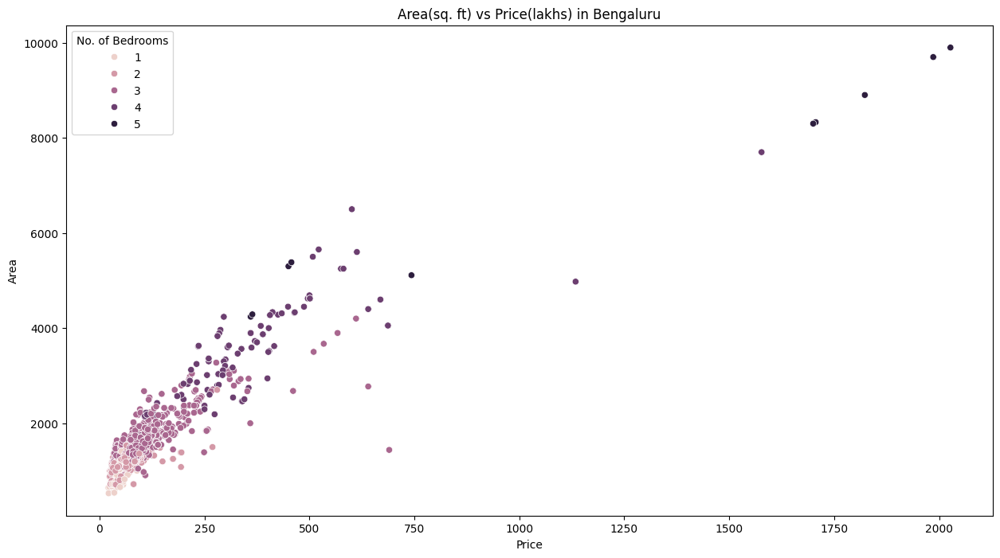

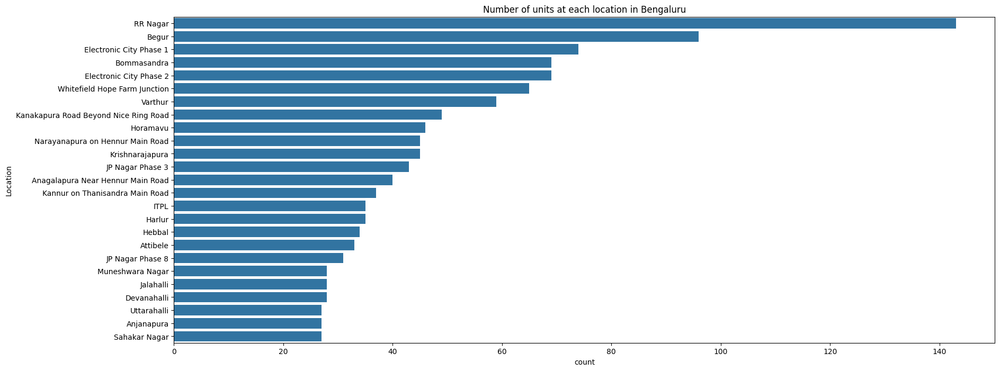

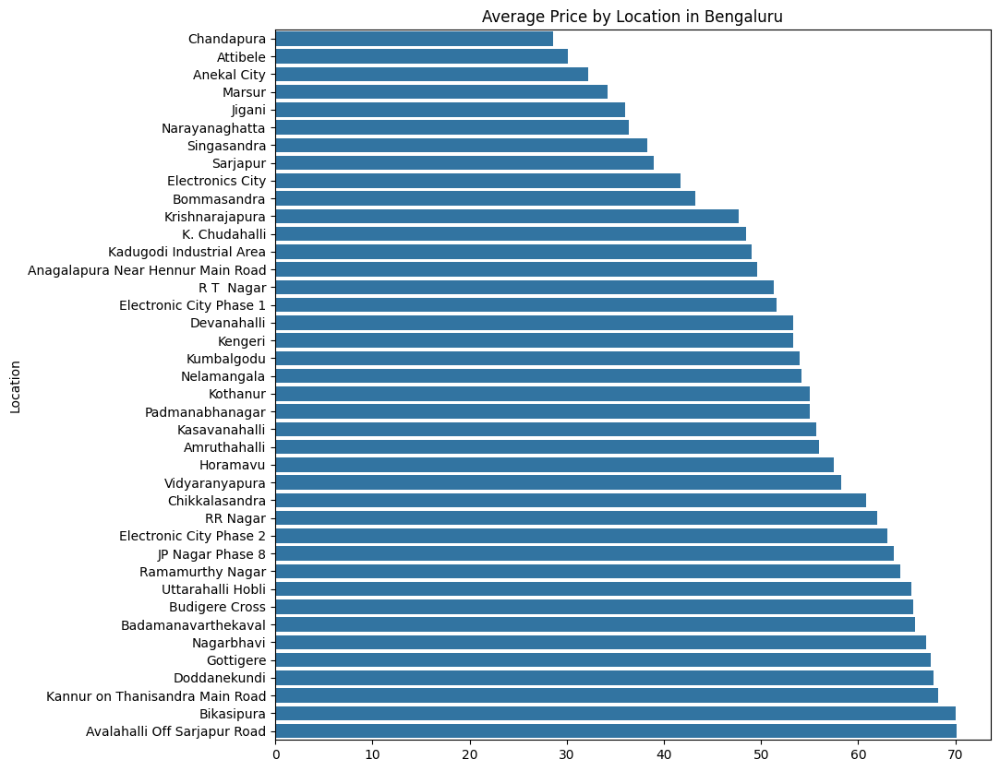

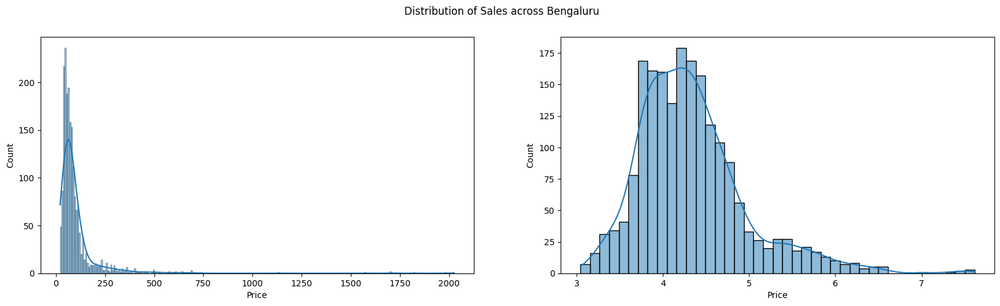

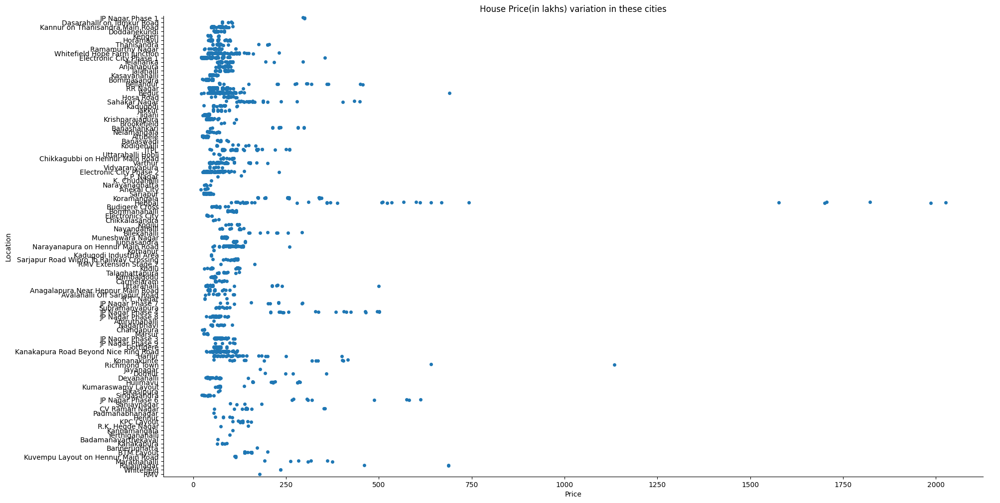

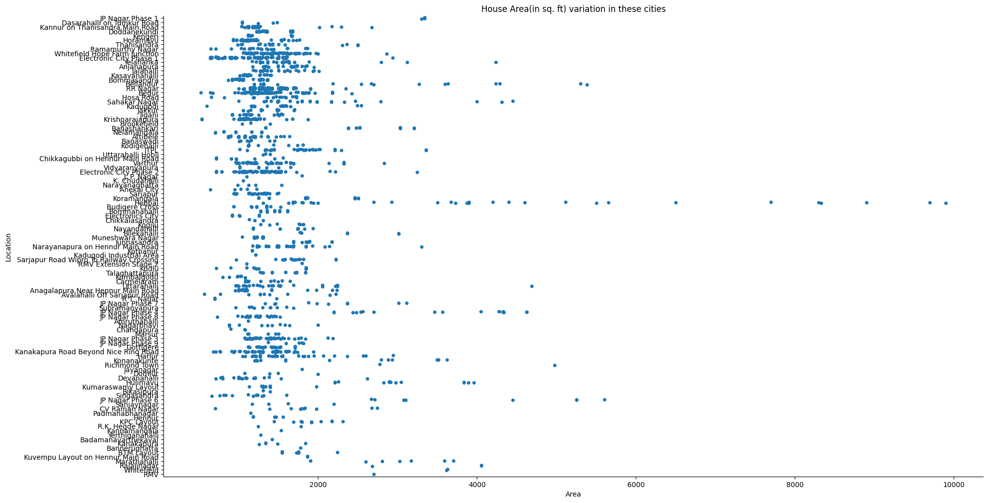

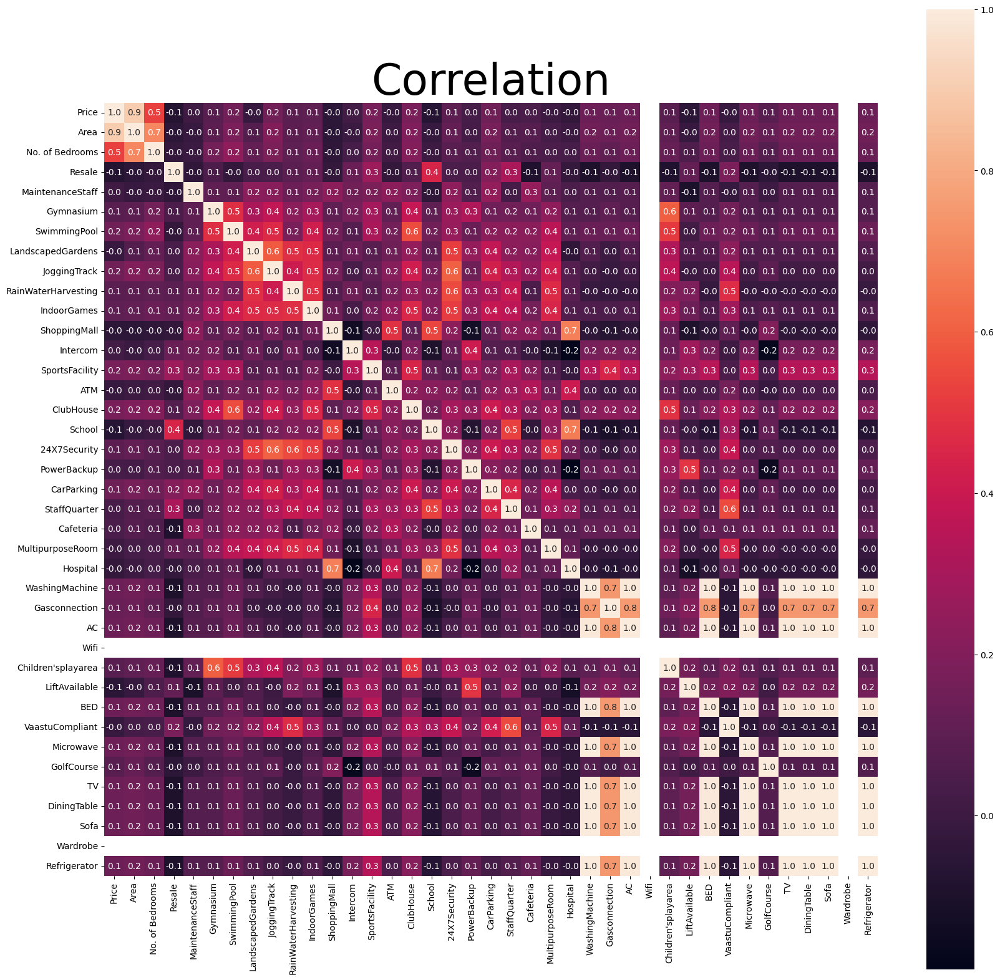

In [69]:
data_plots(ban_df, 'Bengaluru')

Model Training and Performance:

In [16]:
bang_scores = models_evaluation(ban_df)
bang_scores

,Model,R2_Score,Cross-Validation,MAE,MSE,RMSE
0,Linear Regression,0.786148,0.783763,0.198298,0.079627,0.282182
1,Polynomial Regression(^2),0.830571,0.935087,0.103199,0.063086,0.251169
2,Decision Tree Regression,0.829224,0.869653,0.112411,0.063588,0.252166
3,Random Forest Regression,0.894939,0.925365,0.092472,0.039119,0.197785
4,Support Vector Regression,0.906077,0.942433,0.111025,0.034972,0.187007
5,K-Nearest Neighbors,0.796230,0.818549,0.186805,0.075873,0.275450
6,XGBoost Regression,0.917853,0.961944,0.077035,0.030587,0.174892


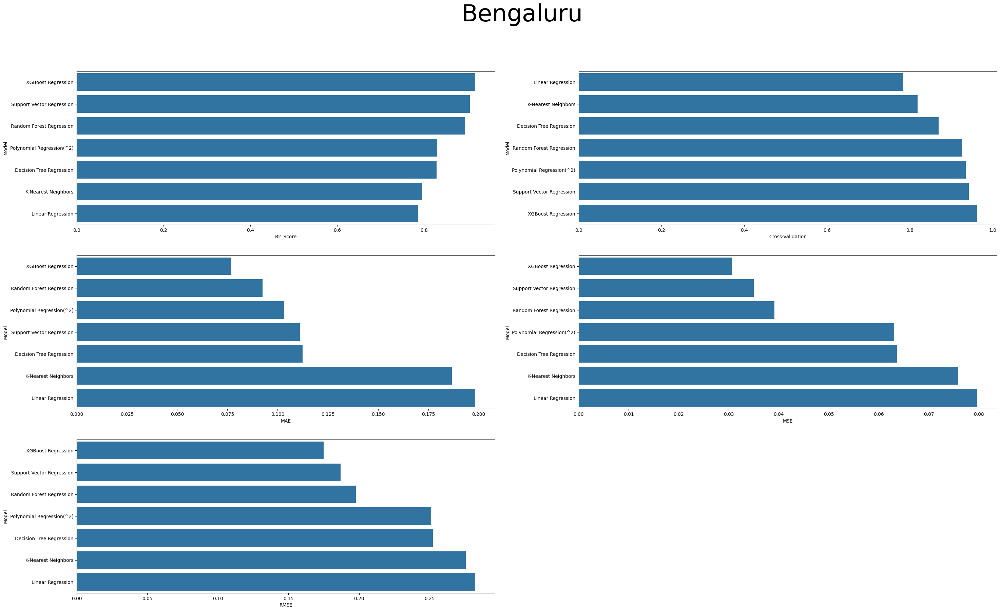

In [18]:
score_plots(bang_scores, 'Bengaluru')

#### Chennai
EDA:

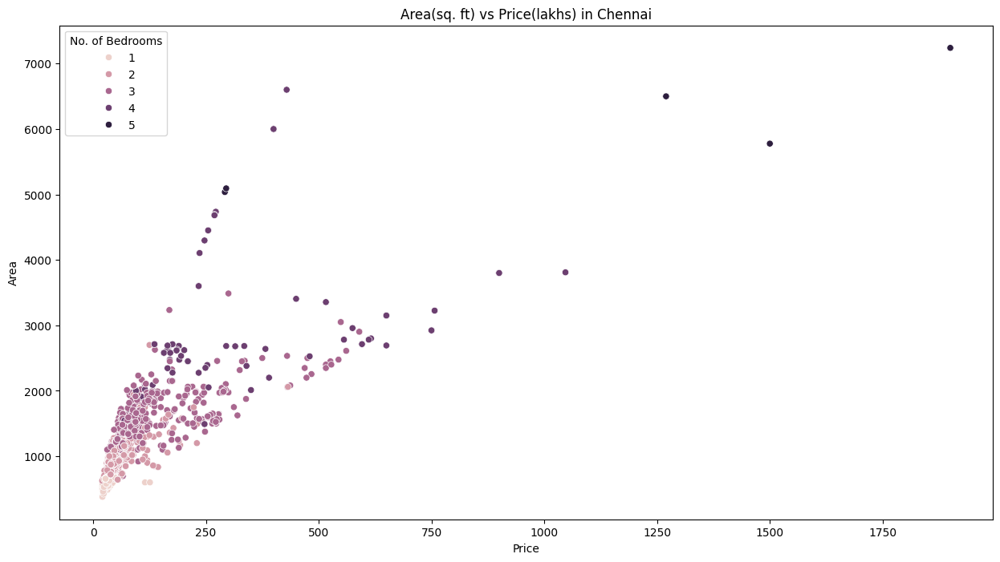

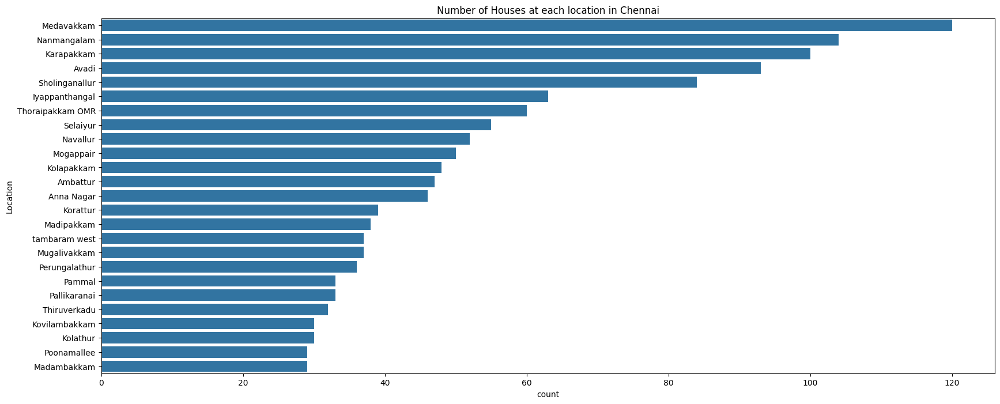

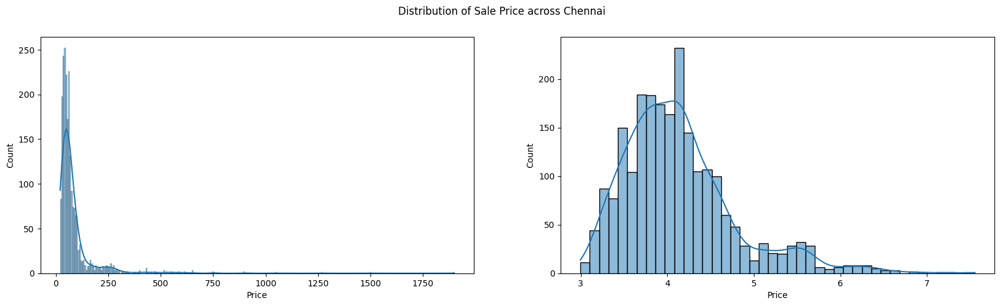

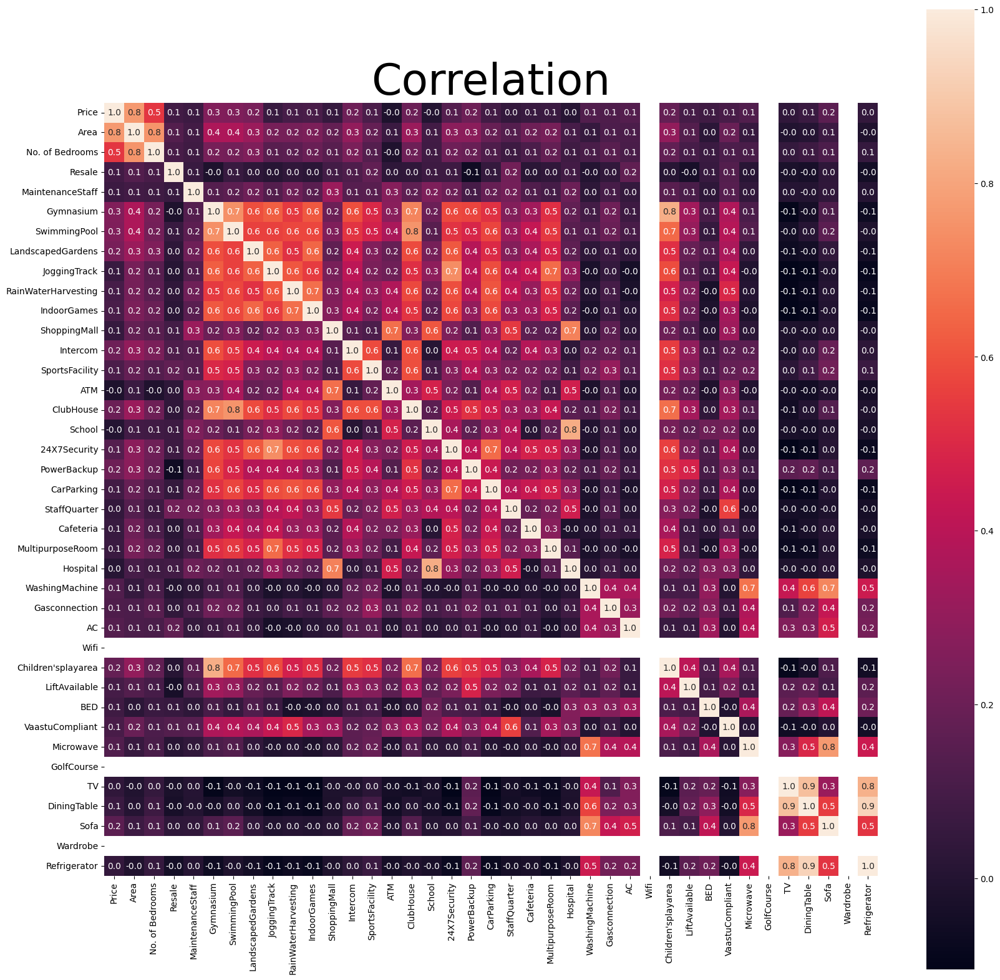

In [19]:
data_plots(chn_df,'Chennai')

Model Training and Performance:

In [20]:
chn_scores = models_evaluation(chn_df)
chn_scores

,Model,R2_Score,Cross-Validation,MAE,MSE,RMSE
0,Linear Regression,0.727686,0.739897,0.237400,0.126384,0.355506
1,Polynomial Regression(^2),0.866968,0.788929,0.148648,0.061742,0.248479
2,Decision Tree Regression,0.873199,0.853093,0.107879,0.058850,0.242590
3,Random Forest Regression,0.931283,0.908336,0.100599,0.031892,0.178584
4,Support Vector Regression,0.871789,0.854274,0.162711,0.059504,0.243935
5,K-Nearest Neighbors,0.843314,0.801259,0.179058,0.072720,0.269666
6,XGBoost Regression,0.955214,0.934805,0.076740,0.020786,0.144172


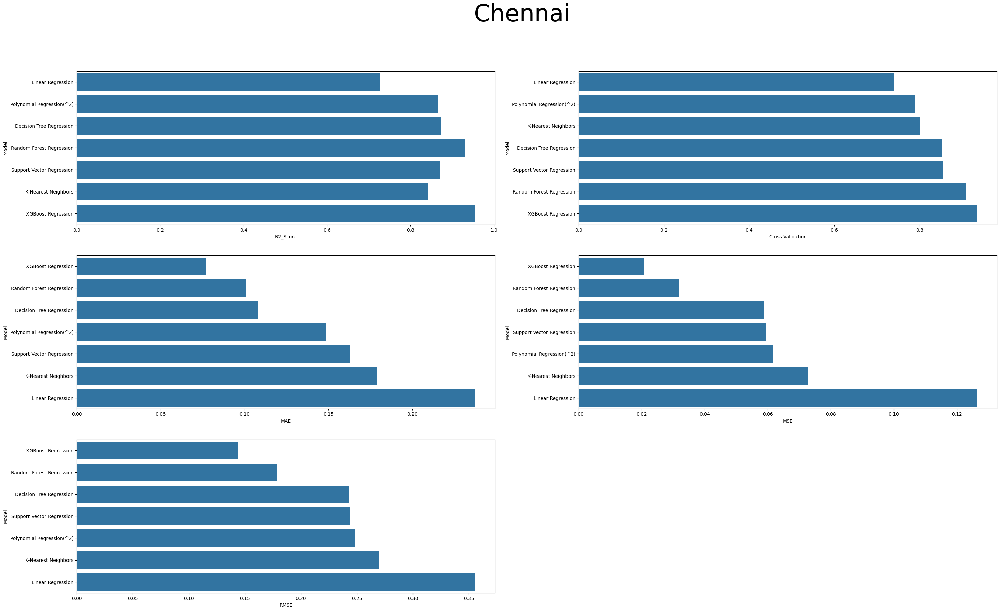

In [21]:
score_plots(chn_scores, 'Chennai')

#### Delhi

EDA:

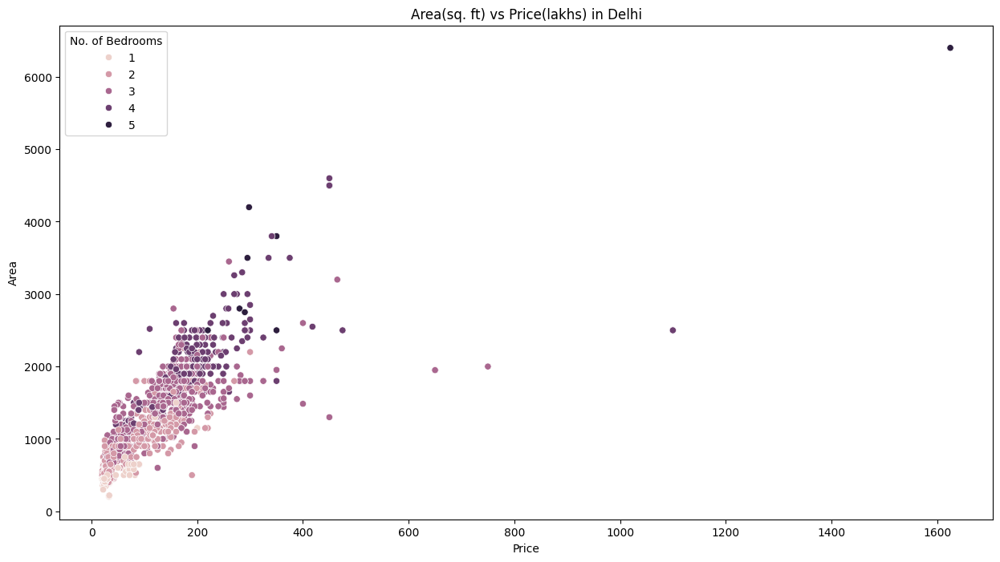

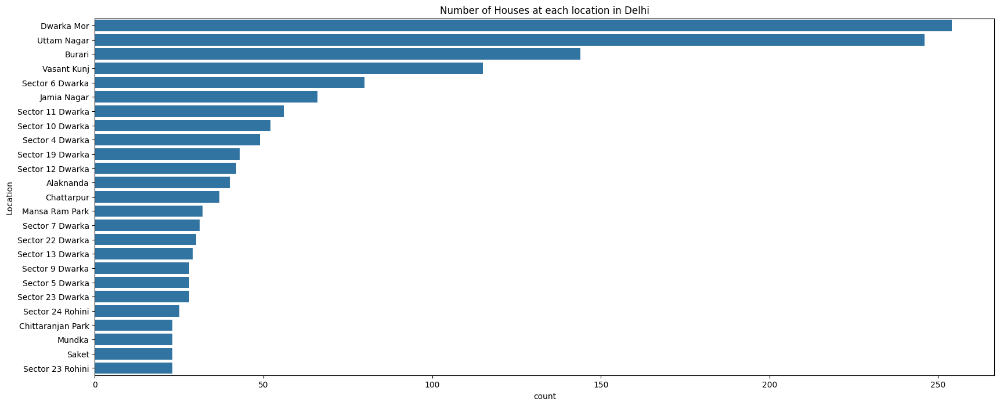

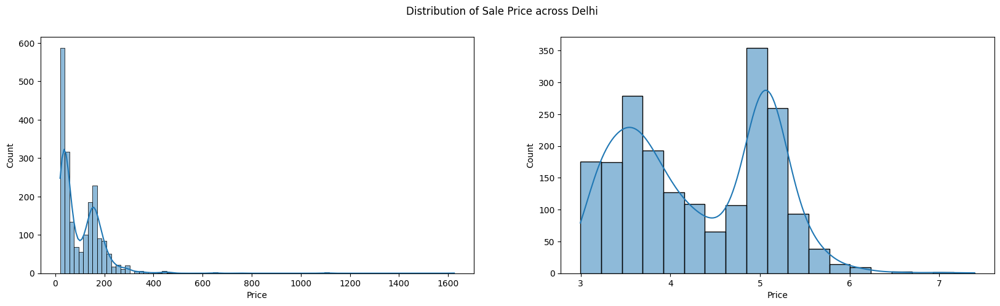

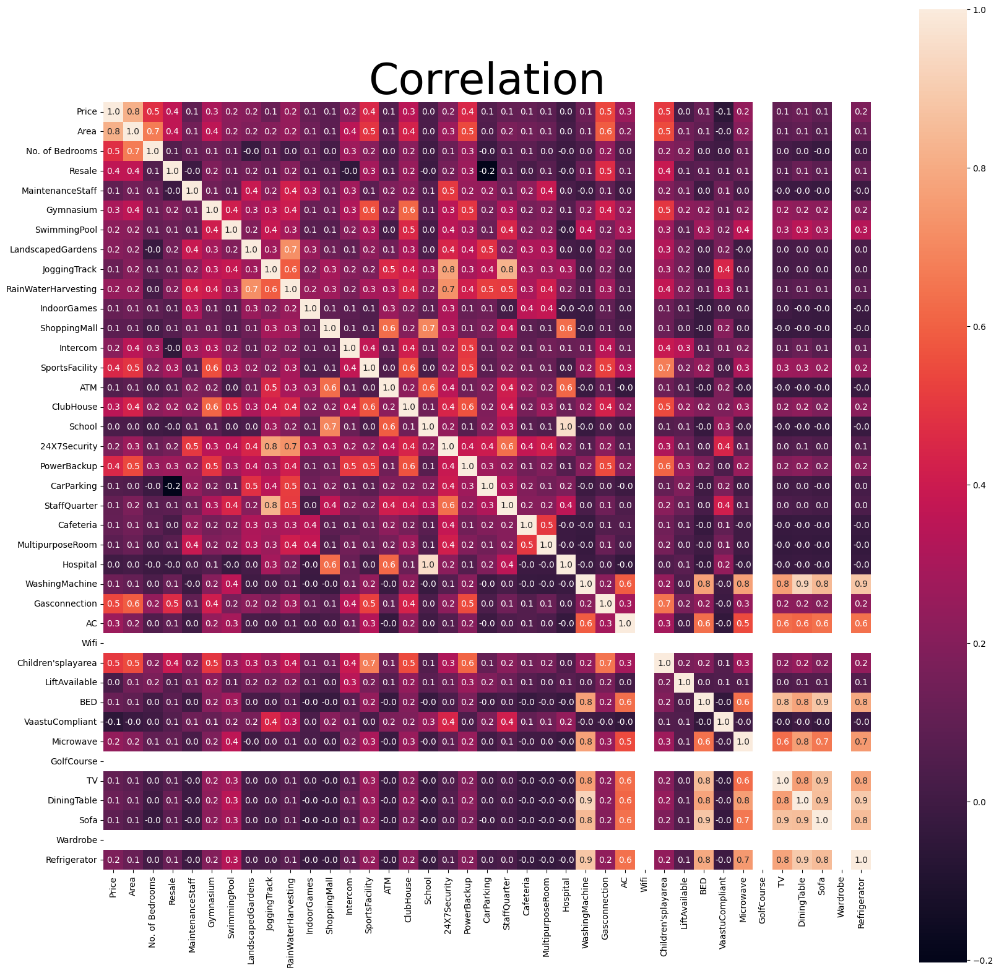

In [22]:
data_plots(del_df, 'Delhi')

Model Training and Performance:

In [23]:
del_scores = models_evaluation(del_df)
del_scores

,Model,R2_Score,Cross-Validation,MAE,MSE,RMSE
0,Linear Regression,0.844094,0.825347,0.236110,0.102590,0.320297
1,Polynomial Regression(^2),0.833730,0.819964,0.218575,0.109410,0.330772
2,Decision Tree Regression,0.900514,0.883728,0.153992,0.065465,0.255860
3,Random Forest Regression,0.944353,0.932450,0.122202,0.036617,0.191357
4,Support Vector Regression,0.895031,0.887366,0.179614,0.069072,0.262816
5,K-Nearest Neighbors,0.887470,0.878838,0.177521,0.074048,0.272117
6,XGBoost Regression,0.949684,0.937770,0.116788,0.033109,0.181959


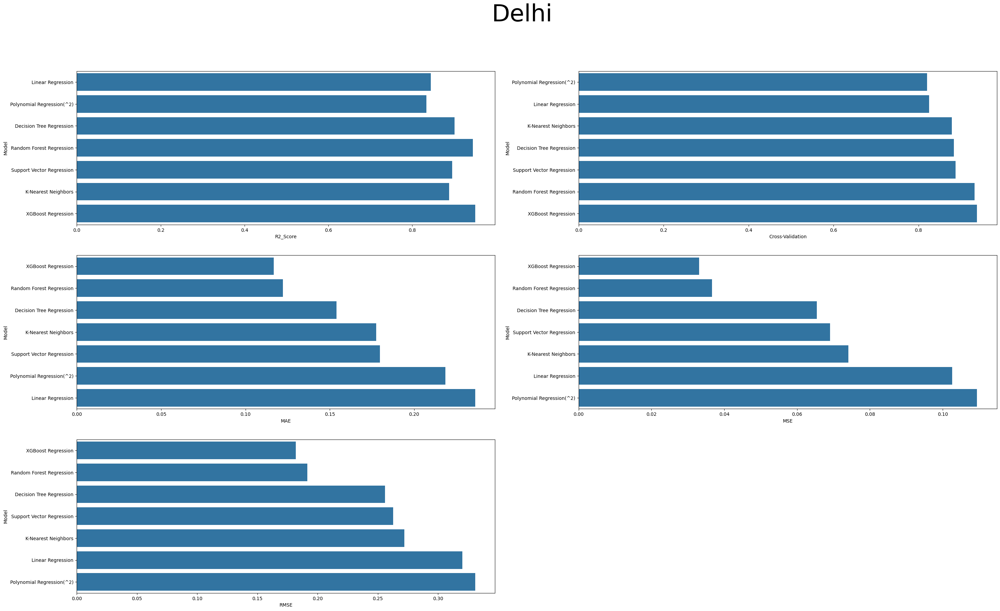

In [24]:
score_plots(del_scores, 'Delhi')

#### Hyderabad
EDA:

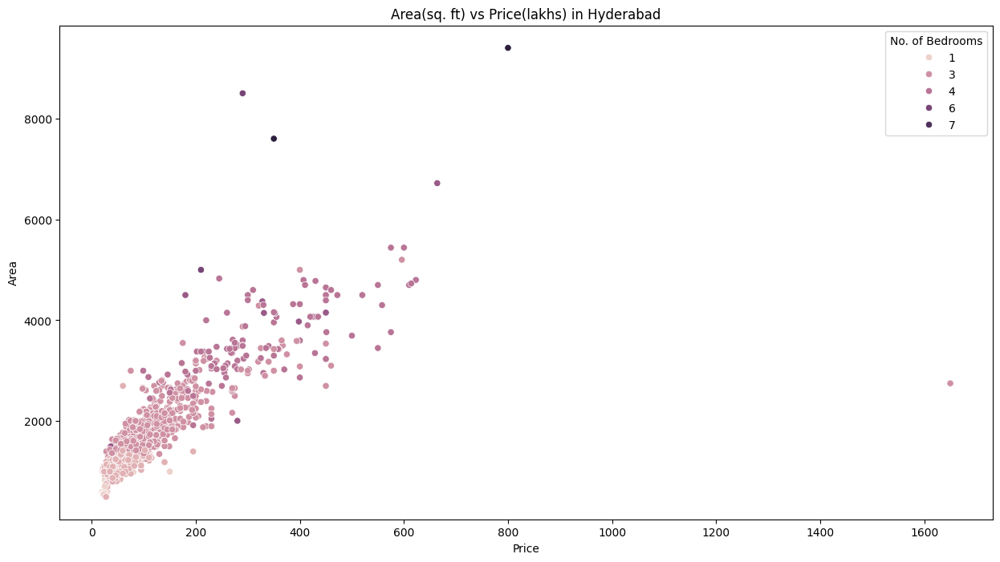

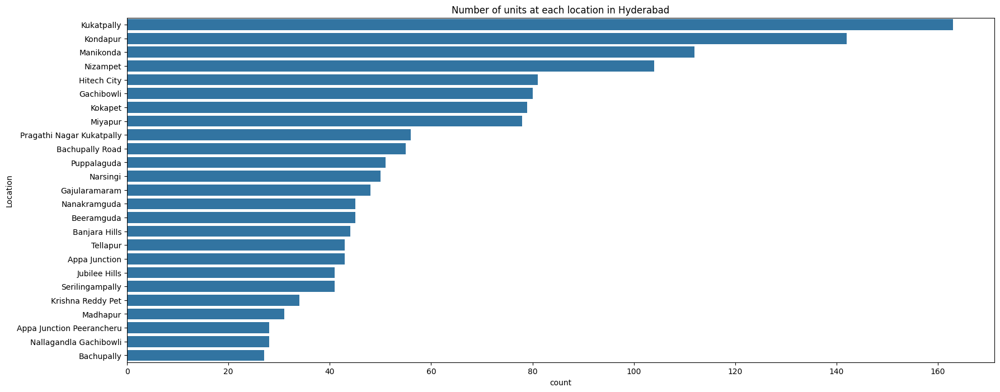

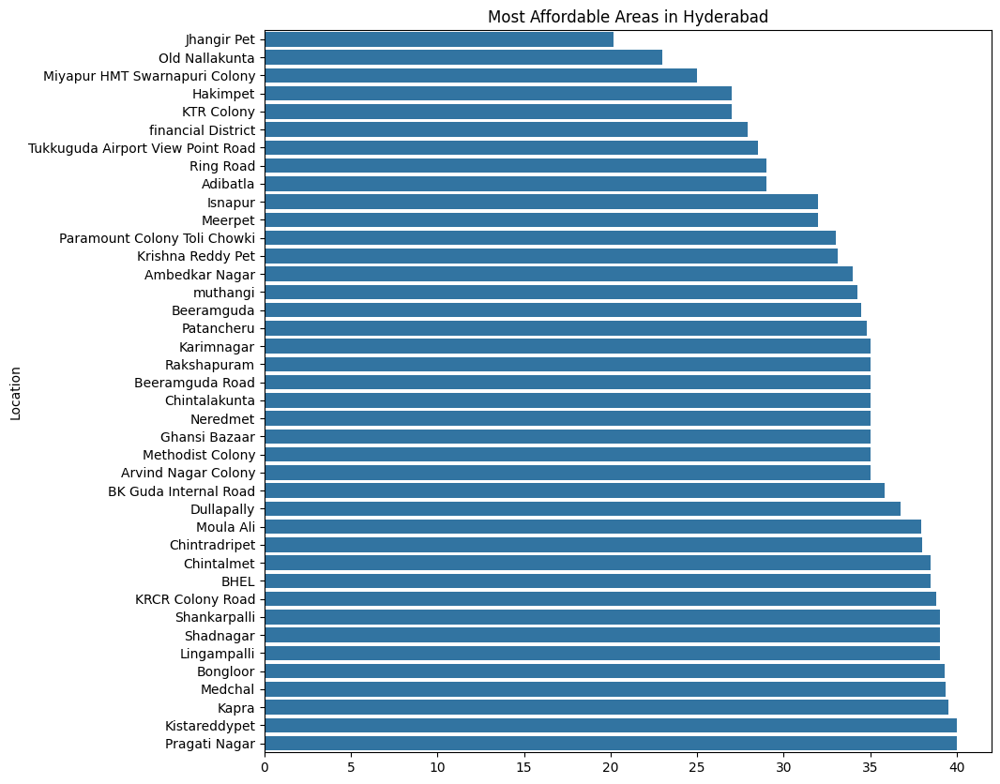

C:\Users\prave\AppData\Local\Temp\ipykernel_3496\4091594371.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=most_demanded_locations['Count'], y=most_demanded_locations.index, palette='viridis')


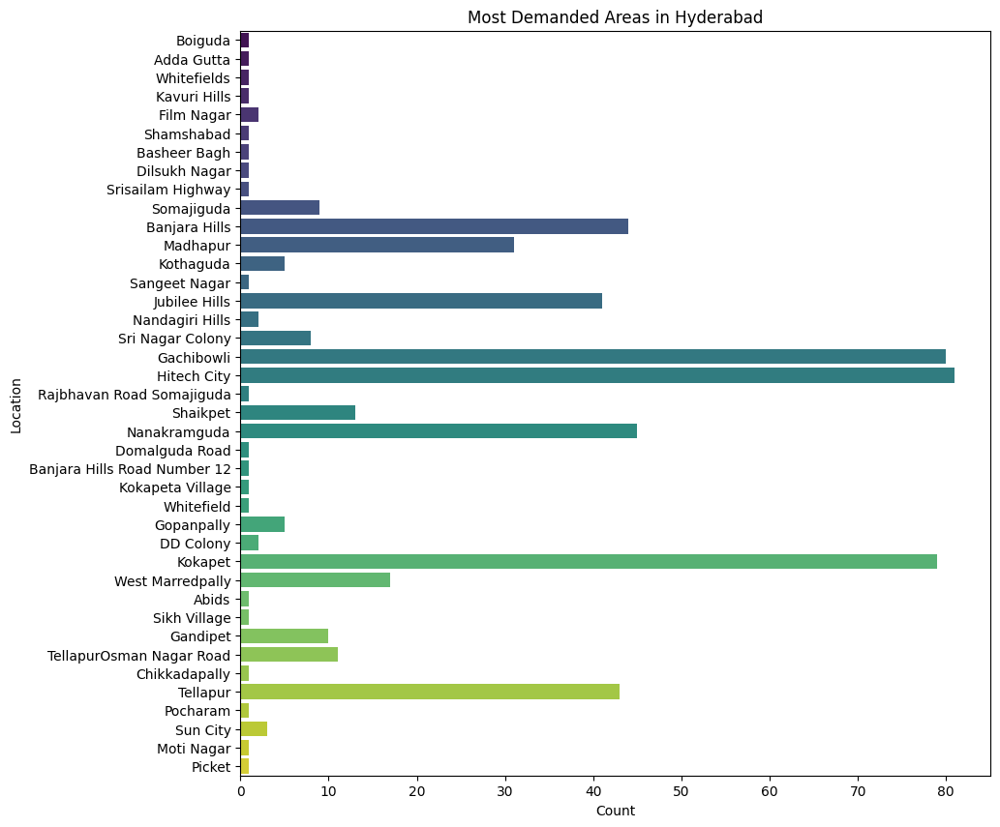

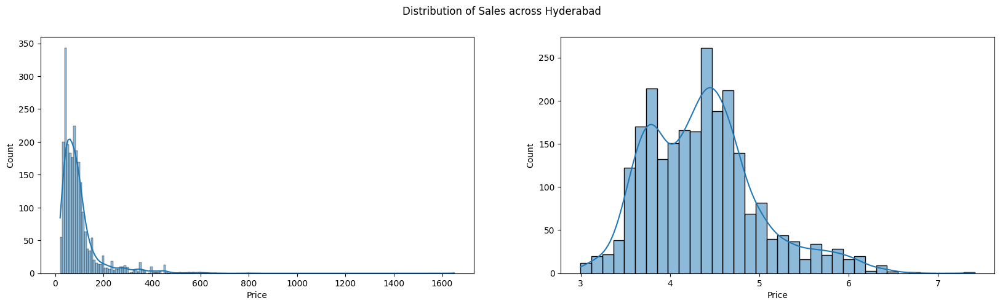

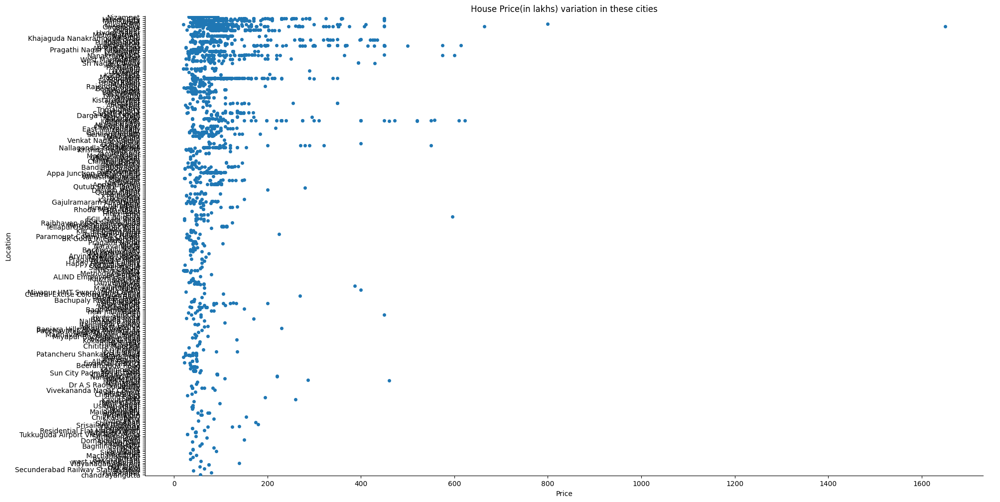

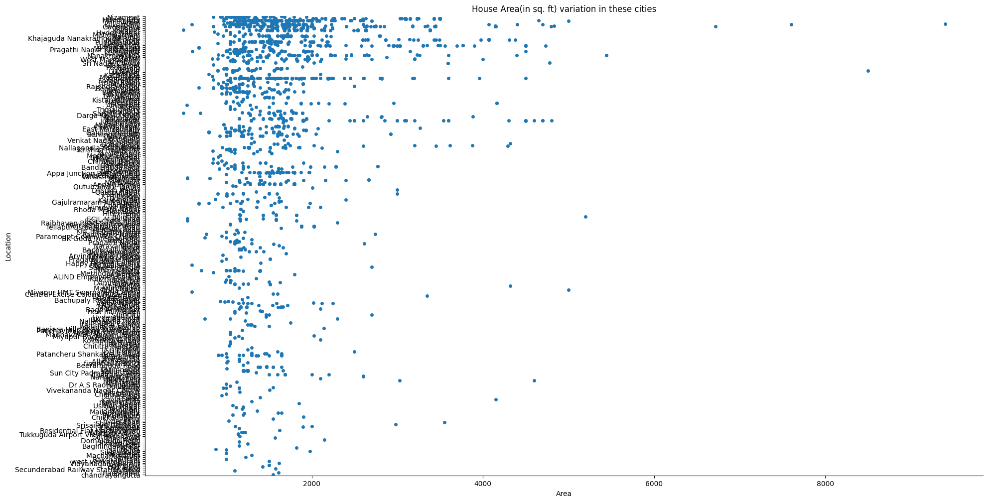

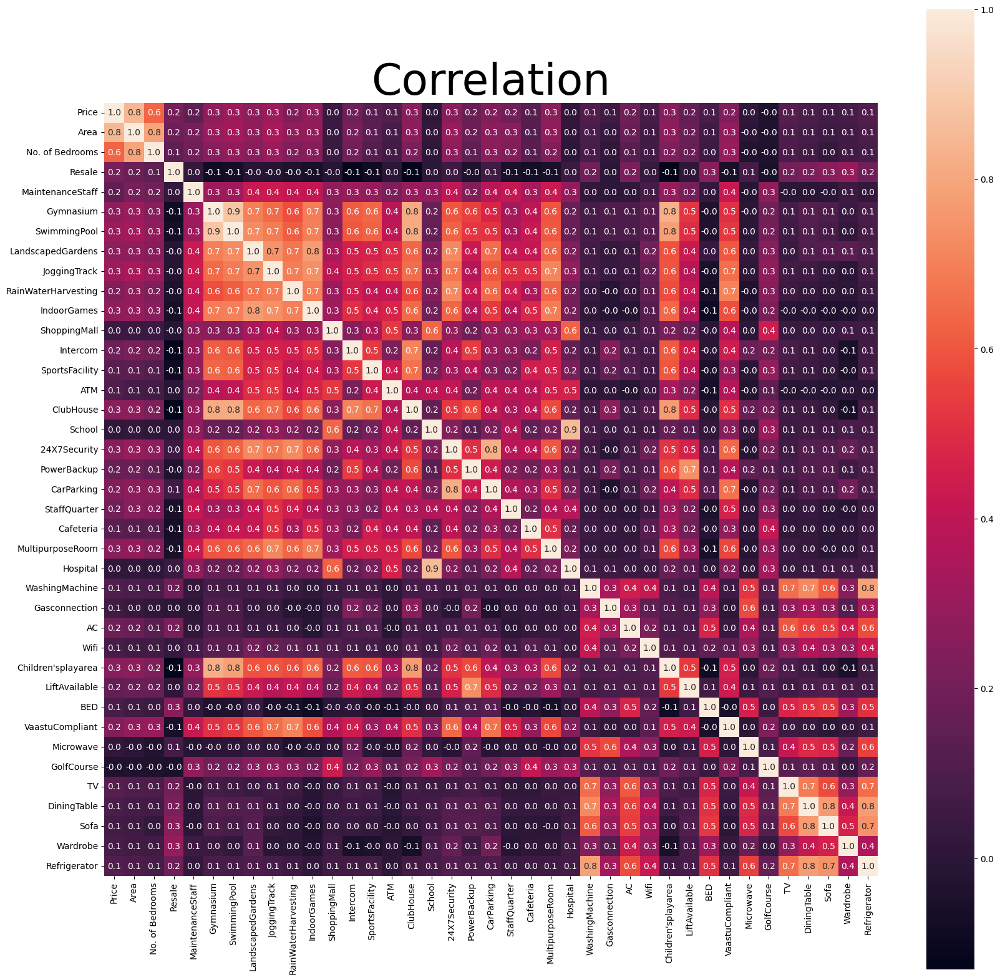

In [103]:
data_plots(hyd_df, 'Hyderabad')

Model Training and Performance:

In [26]:
hyd_scores = models_evaluation(hyd_df)
hyd_scores

C:\Users\prave\AppData\Local\Temp\ipykernel_8676\1671416728.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Location'] = label_encoder.fit_transform(df.Location)


,Model,R2_Score,Cross-Validation,MAE,MSE,RMSE
0,Linear Regression,0.747118,0.784456,0.225175,0.096034,0.309893
1,Polynomial Regression(^2),0.613826,0.699295,0.208680,0.146652,0.382952
2,Decision Tree Regression,0.794835,0.840673,0.153140,0.077913,0.279129
3,Random Forest Regression,0.864724,0.901257,0.126037,0.051372,0.226654
4,Support Vector Regression,0.825848,0.831272,0.176245,0.066135,0.257168
5,K-Nearest Neighbors,0.806691,0.849350,0.177966,0.073410,0.270944
6,XGBoost Regression,0.880963,0.908134,0.122302,0.045205,0.212615


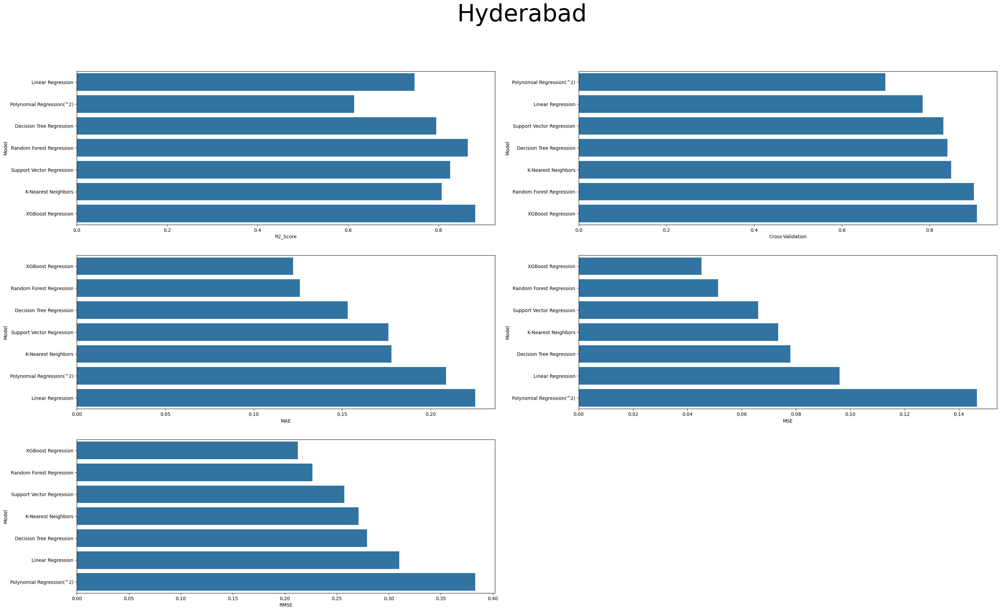

In [27]:
score_plots(hyd_scores, 'Hyderabad')

#### Mumbai
EDA:

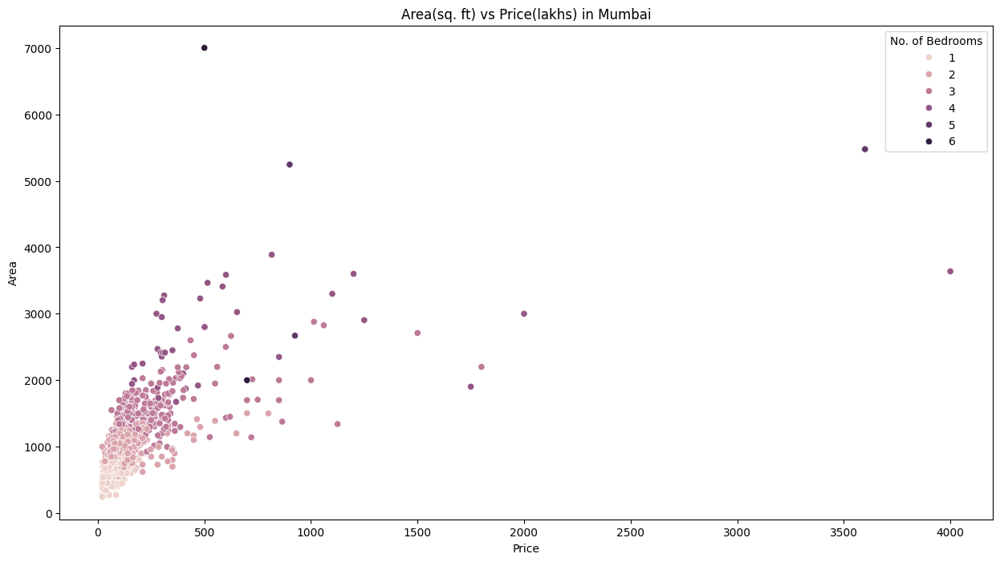

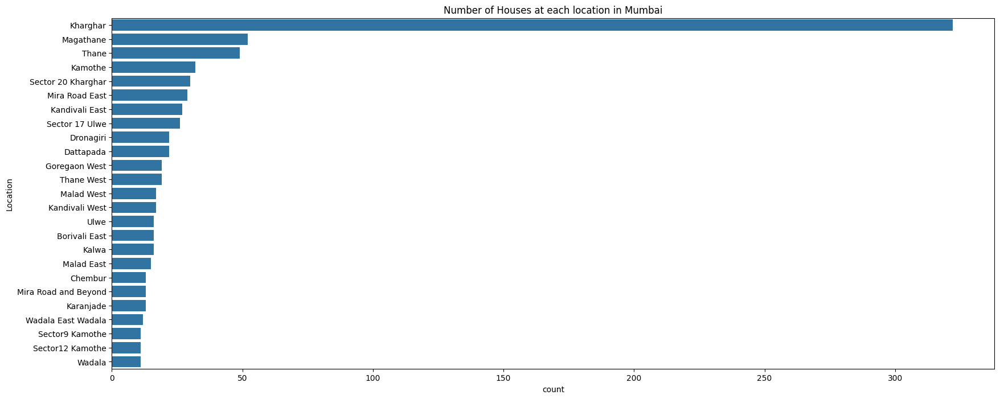

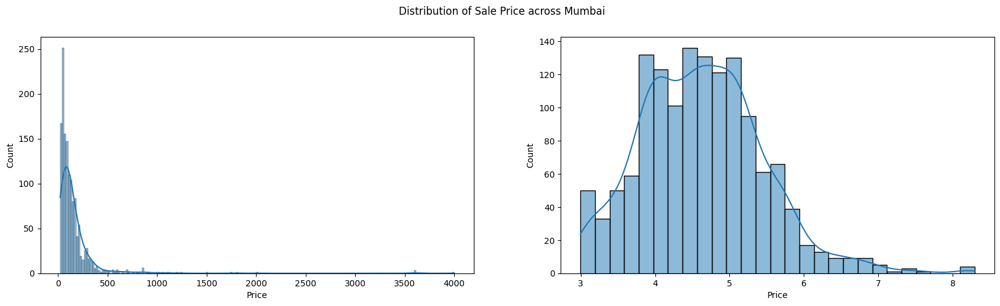

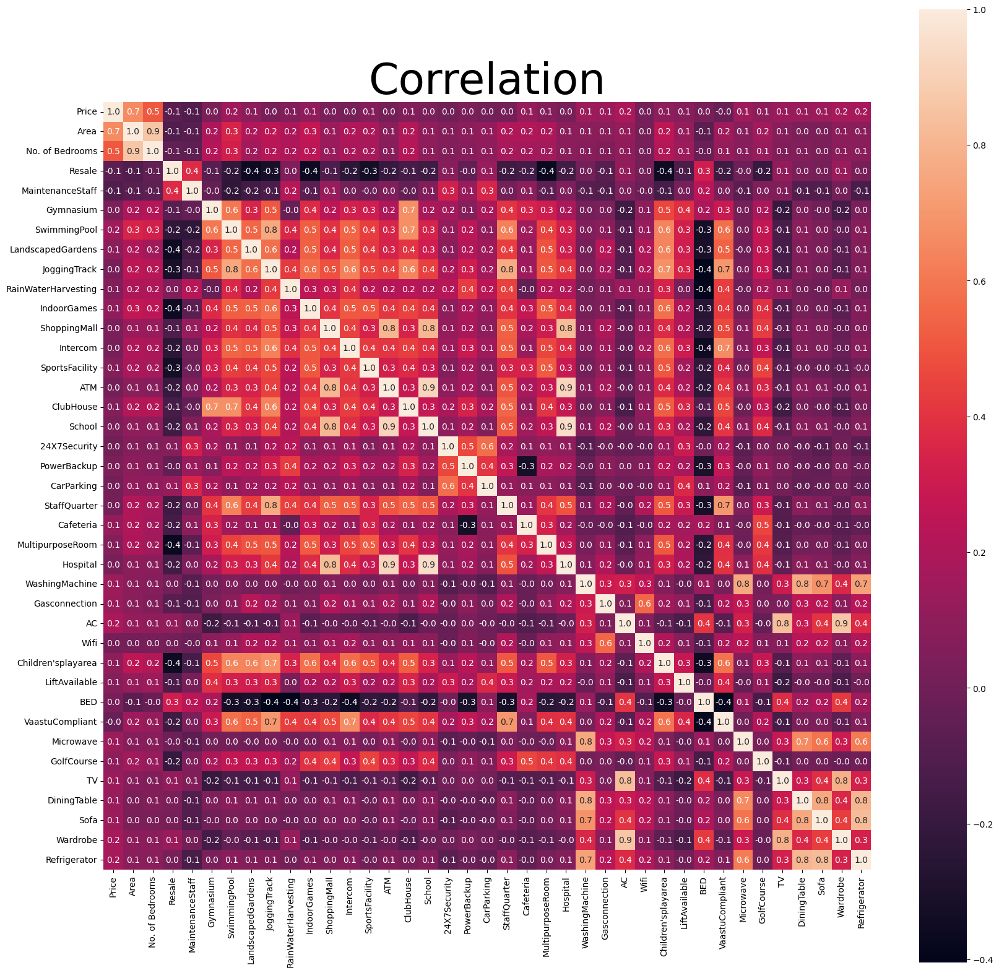

In [28]:
data_plots(mum_df, 'Mumbai')

Model Training and Performance:

In [29]:
mum_scores = models_evaluation(mum_df)
mum_scores

,Model,R2_Score,Cross-Validation,MAE,MSE,RMSE
0,Linear Regression,0.599239,0.661841,0.358395,0.249539,0.499538
1,Polynomial Regression(^2),0.614263,0.559178,0.322369,0.240184,0.490086
2,Decision Tree Regression,0.658563,0.690571,0.255690,0.212600,0.461085
3,Random Forest Regression,0.801474,0.830471,0.224698,0.123615,0.351589
4,Support Vector Regression,0.758665,0.715489,0.275118,0.150270,0.387646
5,K-Nearest Neighbors,0.653213,0.661295,0.332816,0.215931,0.464683
6,XGBoost Regression,0.845799,0.834114,0.195337,0.096015,0.309863


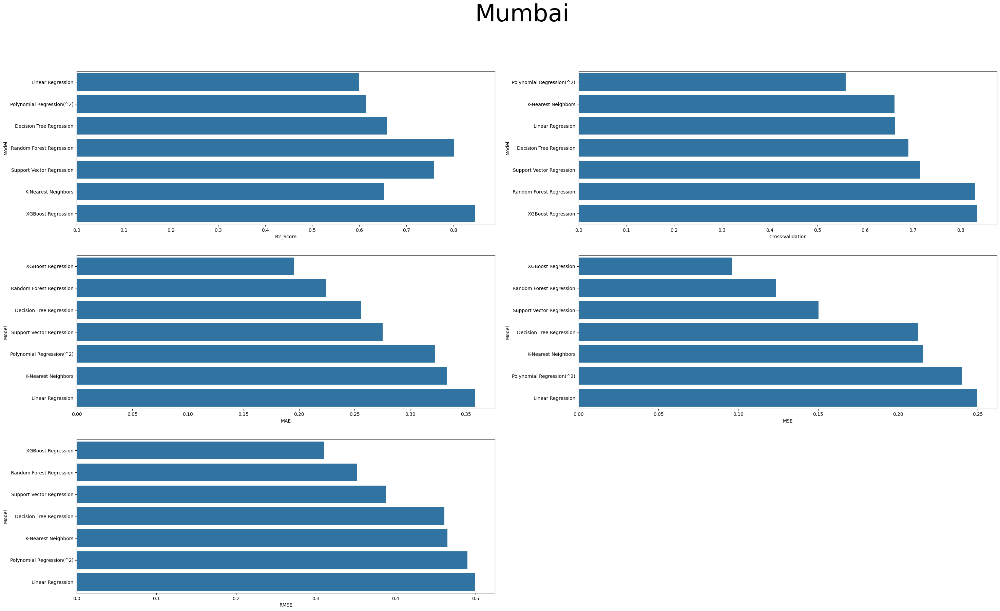

In [30]:
score_plots(mum_scores, 'Mumbai')

#### Merged Dataset

In [104]:
merged_df = merge_all(ban_df, chn_df, del_df, hyd_df, mum_df)

EDA:

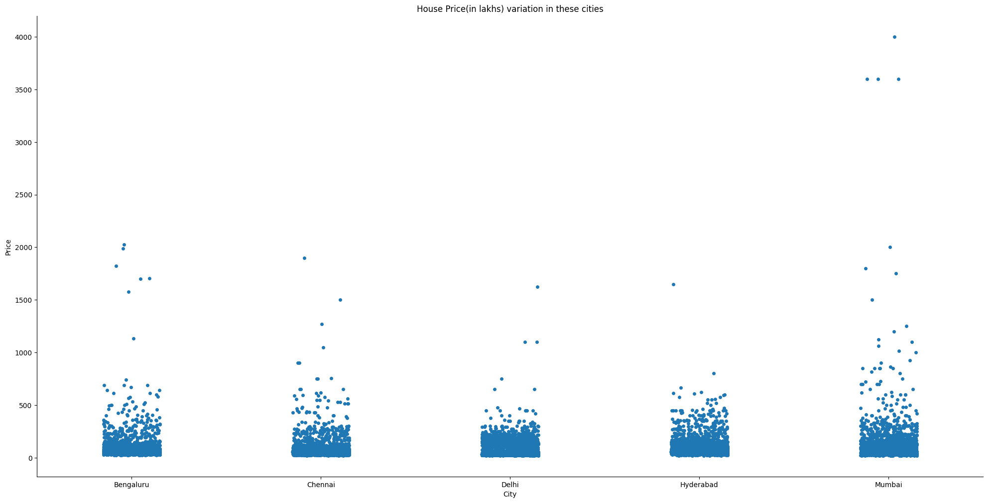

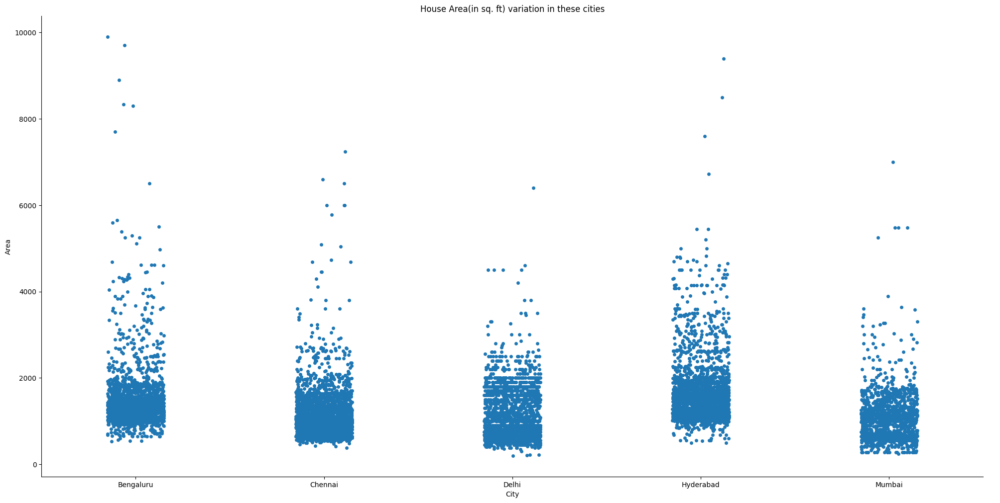

C:\Users\prave\AppData\Local\Temp\ipykernel_3496\3219803567.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x[['Price', 'Area']].rolling(window=window_size).mean())


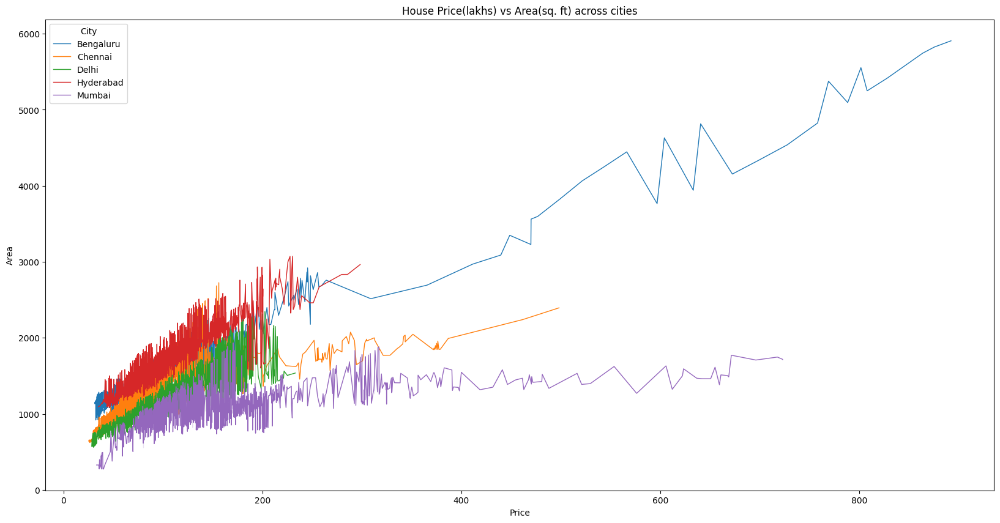

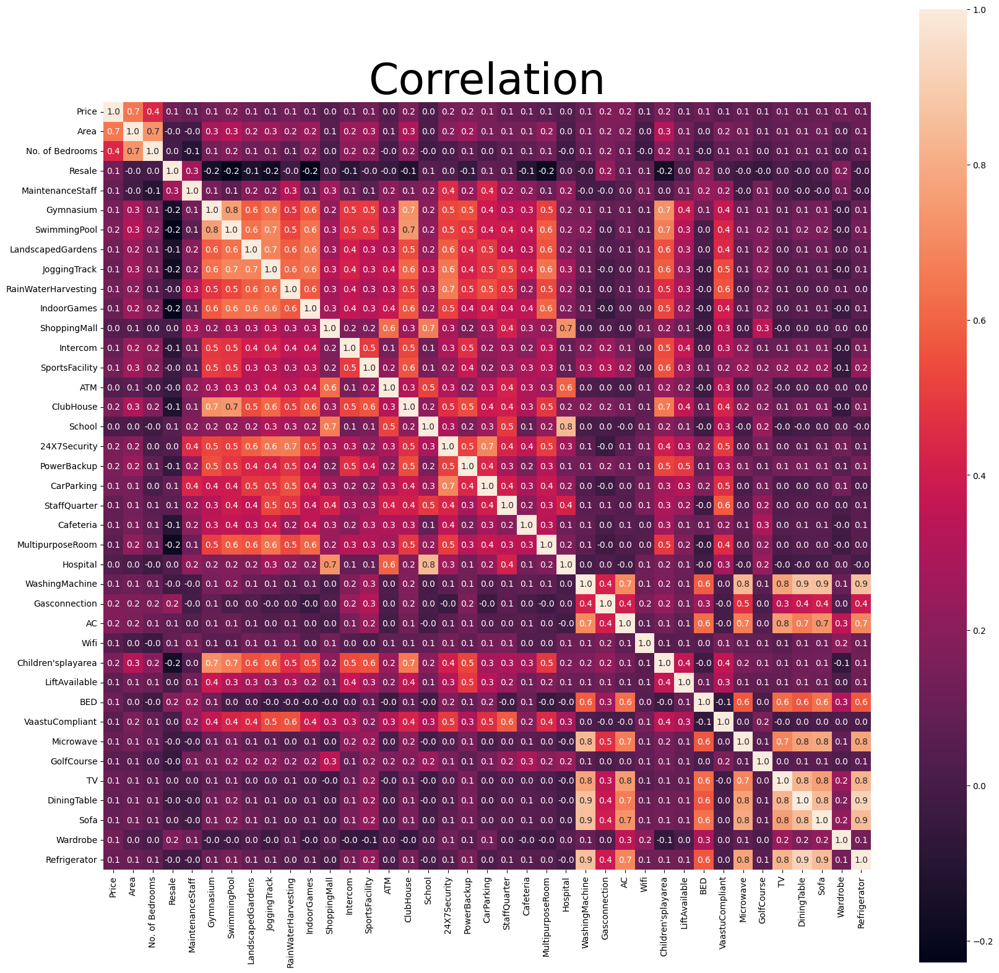

In [136]:
merged_plots(merged_df)

Model Training and Performance:

In [33]:
merged_df['City'] = LabelEncoder().fit_transform(merged_df.City)
mergeddf_scores = models_evaluation(merged_df)
mergeddf_scores

,Model,R2_Score,Cross-Validation,MAE,MSE,RMSE
0,Linear Regression,0.694133,0.687096,0.291653,0.159083,0.398852
1,Polynomial Regression(^2),0.740250,0.724118,0.233547,0.135098,0.367556
2,Decision Tree Regression,0.842081,0.815063,0.145100,0.082134,0.286591
3,Random Forest Regression,0.912051,0.892163,0.125228,0.045743,0.213876
4,Support Vector Regression,0.835234,0.815791,0.189645,0.085696,0.292738
5,K-Nearest Neighbors,0.712584,0.666259,0.252949,0.149487,0.386635
6,XGBoost Regression,0.916542,0.903947,0.129766,0.043407,0.208343


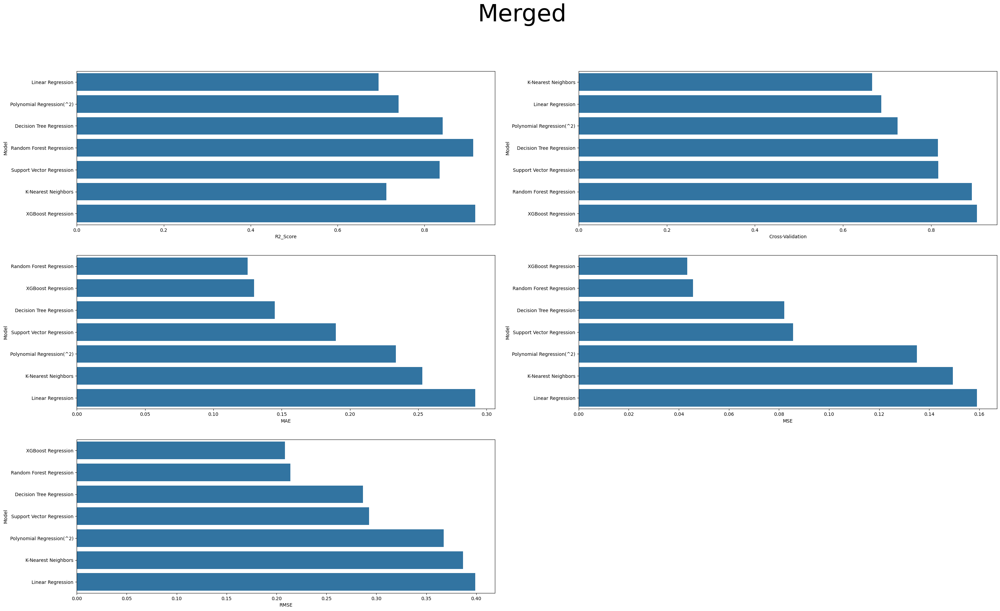

In [34]:
score_plots(mergeddf_scores, 'Merged')

# Interactive Housing Market Map
An interactive map visualization of housing locations across major Indian cities, the map provides a comprehensive view of the real estate landscape, allowing users to explore property locations visually

In [35]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

df = pd.read_csv('C:/Users/prave/Documents/GitHub/Housing market/MiniProject/Data/Combined_data.csv')

# Create a map centered on Hyderabad
city_map = folium.Map(location=[17.401, 78.477], zoom_start=15, tiles='cartodbpositron')

# Create a MarkerCluster
mc = MarkerCluster()

# Add markers for each location
for idx, row in df.iterrows():
    popup_text = row['Location']
    mc.add_child(folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text
    ))

# Add the MarkerCluster to the map
city_map.add_child(mc)

# Save the map to an HTML file
city_map.save("housing_map.html")

city_map